In [45]:
### 설치 pip install python-opencv

In [1]:
## 기본 모듈
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split

## 딥러닝 모듈
import tensorflow
from tensorflow import keras
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Flatten, Conv2D, MaxPooling2D
from keras.layers import BatchNormalization, Dropout
from keras.applications import VGG16, VGG19
from keras.utils import to_categorical
from keras.optimizers import Adam
from keras.callbacks import TensorBoard, EarlyStopping

In [2]:
from glob import glob
import cv2 as cv

In [3]:
file_list = glob("./data/train/*.jpg")

In [4]:
file_list[0]

'./data/train\\cat.0.jpg'

In [5]:
x = plt.imread(file_list[0])

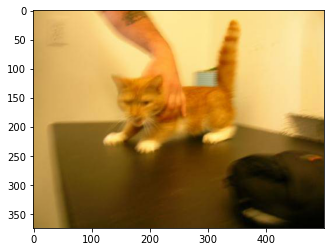

In [6]:
plt.imshow(x)

In [7]:
type(x)

numpy.ndarray

In [8]:
for file in file_list[:5]:
    print(plt.imread(file).shape)

(374, 500, 3)
(280, 300, 3)
(499, 489, 3)
(499, 403, 3)
(149, 150, 3)


In [9]:
x = cv.resize(plt.imread(file_list[0]),(150,150))

(150, 150, 3)


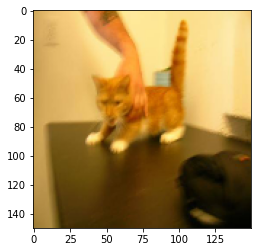

In [10]:
plt.imshow(x)
print(x.shape)

In [11]:
len(file_list)

25000

In [12]:
X = np.zeros((4000,150,150,3))

for idx, file in enumerate(file_list[:2000]):
    x = plt.imread(file)
    x = cv.resize(x,(150,150))
    X[idx] = x
y_cat = np.repeat(0,2000)

for idx, file in enumerate(file_list[12500:14500]):
    idx1 = idx + 2000
    x = plt.imread(file)
    x = cv.resize(x,(150,150))
    X[idx1] = x
y_dog = np.repeat(1,2000)

In [14]:
y = np.concatenate([y_cat, y_dog])

In [ ]:
# y = []
# for idx,file in enumerate(file_list):
#     x = plt.imread(file)
#     x = cv.resize(x,(150,150))
#     X[idx] = x
    
#     if 'cat' in file:
#         y.append(0)
#     else:
#         y.append(1)

In [ ]:
### train_test_split

In [13]:
X.shape

(4000, 150, 150, 3)

In [15]:
y.shape

(4000,)

In [16]:
X_train, X_test, y_train, y_test = train_test_split(X, y)

In [17]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(3000, 150, 150, 3) (3000,)
(1000, 150, 150, 3) (1000,)


In [21]:
input_shape = (150, 150, 3)
output_shape = 1

In [22]:
### Conv2D
model = Sequential(
    [
        Conv2D(50,(5,5),activation="relu",input_shape=input_shape),
        MaxPooling2D((3,3)),
        BatchNormalization(),
        Conv2D(150,(3,3),activation="relu"),
        MaxPooling2D((2,2)),
        Flatten(),
        Dense(128,activation="relu"),
        Dense(output_shape, activation="sigmoid")
    ]
)

In [23]:
opt = Adam(1e-5)
loss = "binary_crossentropy"
metrics = ["accuracy"]
model.compile(
    optimizer=opt,
    loss=loss,
    metrics=metrics
)

In [24]:
dog_cat_callbacks = [
    EarlyStopping(patience=7),
    TensorBoard(log_dir="./dog_cat_logs")
]

In [25]:
model.fit(X_train,
        y_train,
        epochs=15,
        batch_size=100,
        validation_data=(X_test,y_test),
        callbacks=dog_cat_callbacks)

Epoch 1/20
8/8 [==============================] - 92s 10s/step - loss: 0.8124 - accuracy: 0.5227 - val_loss: 0.8961 - val_accuracy: 0.5740
Epoch 2/20
1/8 [==>...........................] - ETA: 1:53 - loss: 0.6681 - accuracy: 0.6000

KeyboardInterrupt: 

In [26]:
model.evaluate(X_train,y_train)

94/94 [==============================] - 22s 230ms/step - loss: 0.8584 - accuracy: 0.5627


[0.8584124445915222, 0.562666654586792]

In [27]:
model.evaluate(X_test,y_test)

32/32 [==============================] - 7s 213ms/step - loss: 0.9060 - accuracy: 0.5270


[0.9060469269752502, 0.5270000100135803]

In [28]:
inds = np.random.choice(np.arange(100), 100, replace=False)

1/1 [==============================] - 0s 30ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 73


C:\Users\admin\AppData\Local\Temp\ipykernel_3104\1621309168.py:2: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  plt.imshow(X_train[ind].astype(np.int))


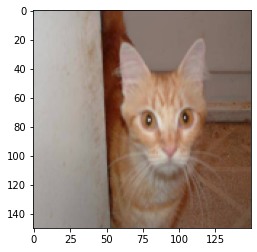

1/1 [==============================] - 0s 31ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 62


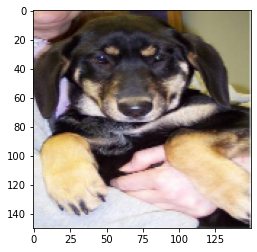

1/1 [==============================] - 0s 35ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 76


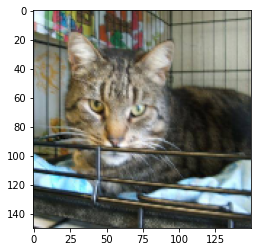

1/1 [==============================] - 0s 28ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 82


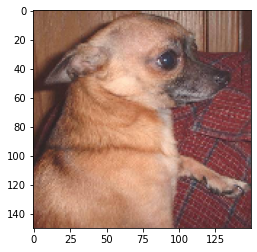

1/1 [==============================] - 0s 45ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 10


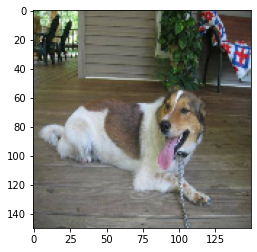

1/1 [==============================] - 0s 24ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 7


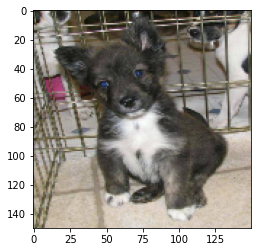

1/1 [==============================] - 0s 28ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 89


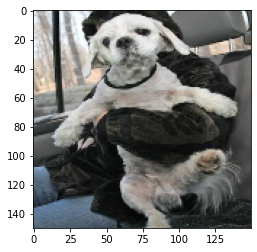

1/1 [==============================] - 0s 45ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 54


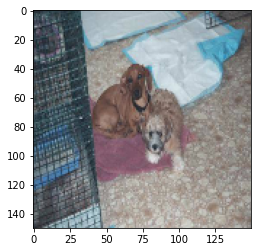

1/1 [==============================] - 0s 44ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 93


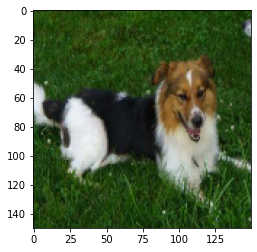

1/1 [==============================] - 0s 37ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 16


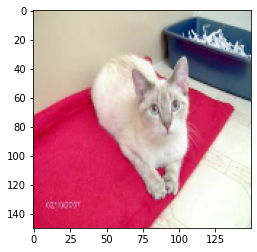

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 44


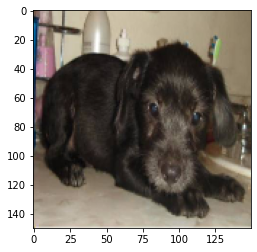

1/1 [==============================] - 0s 25ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 99


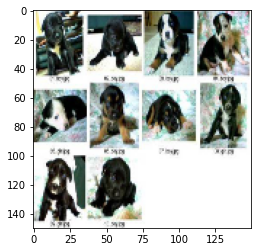

1/1 [==============================] - 0s 27ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 14


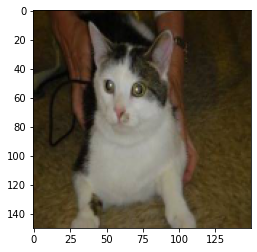

1/1 [==============================] - 0s 27ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 26


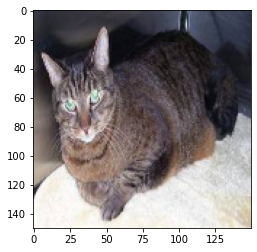

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 48


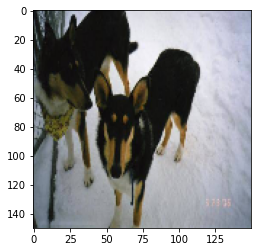

1/1 [==============================] - 0s 47ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 36


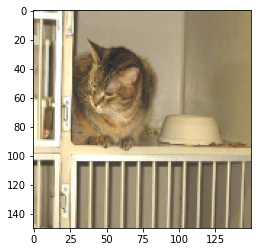

1/1 [==============================] - 0s 32ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 49


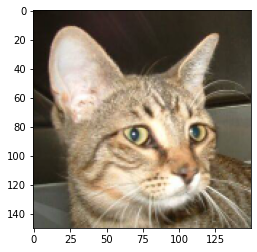

1/1 [==============================] - 0s 28ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 96


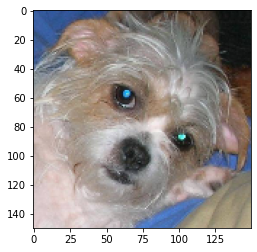

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 1


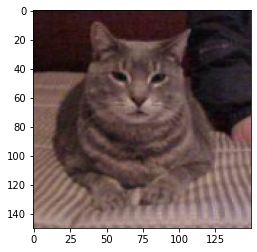

1/1 [==============================] - 0s 45ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 84


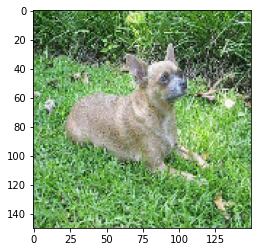

1/1 [==============================] - 0s 25ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 86


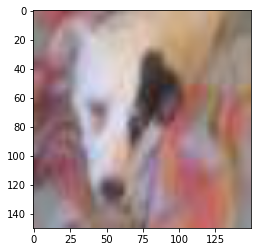

1/1 [==============================] - 0s 32ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 78


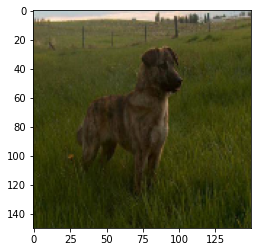

1/1 [==============================] - 0s 24ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 30


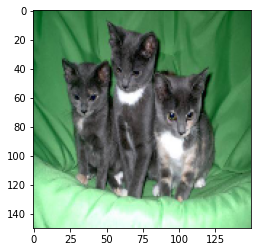

1/1 [==============================] - 0s 28ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 88


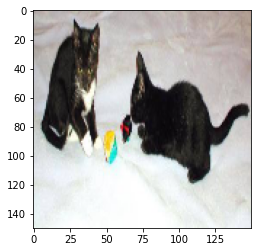

1/1 [==============================] - 0s 29ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 68


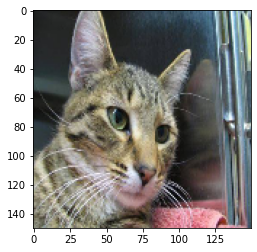

1/1 [==============================] - 0s 28ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 13


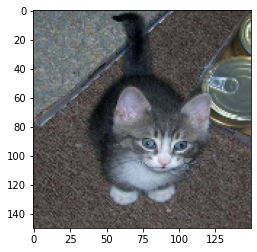

1/1 [==============================] - 0s 25ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 95


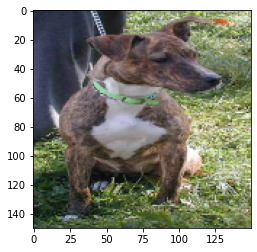

1/1 [==============================] - 0s 31ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 85


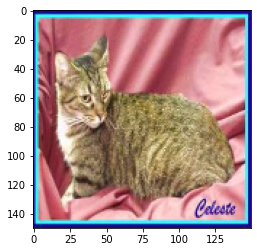

1/1 [==============================] - 0s 82ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 81


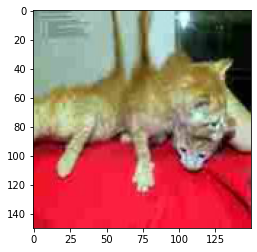

1/1 [==============================] - 0s 27ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 24


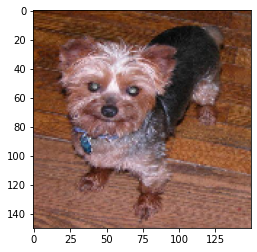

1/1 [==============================] - 0s 48ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 90


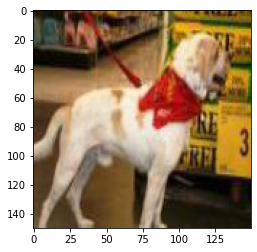

1/1 [==============================] - 0s 25ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 21


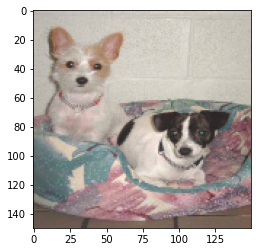

1/1 [==============================] - 0s 26ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 39


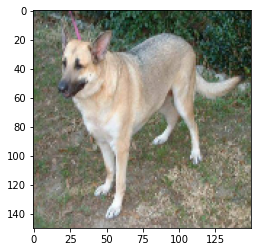

1/1 [==============================] - 0s 27ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 9


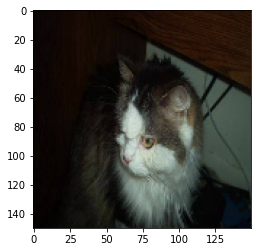

1/1 [==============================] - 0s 47ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 87


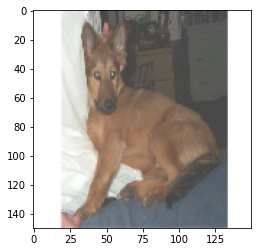

1/1 [==============================] - 0s 29ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 6


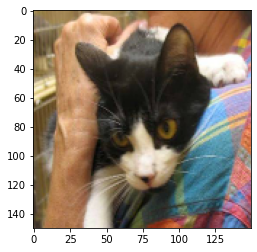

1/1 [==============================] - 0s 46ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 17


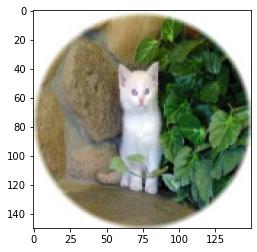

1/1 [==============================] - 0s 26ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 67


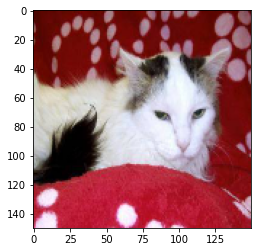

1/1 [==============================] - 0s 25ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 43


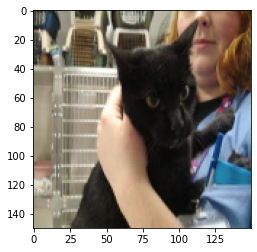

1/1 [==============================] - 0s 34ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 97


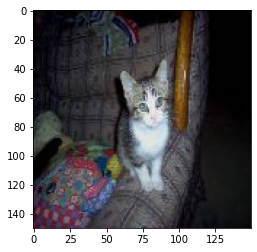

1/1 [==============================] - 0s 34ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 47


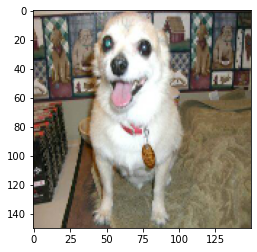

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 92


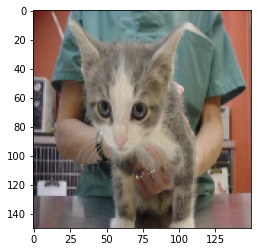

1/1 [==============================] - 0s 33ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 70


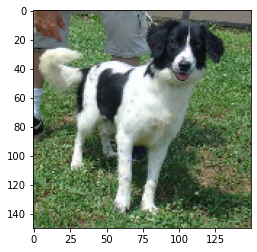

1/1 [==============================] - 0s 35ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 3


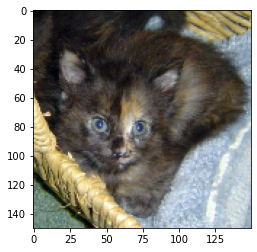

1/1 [==============================] - 0s 30ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 72


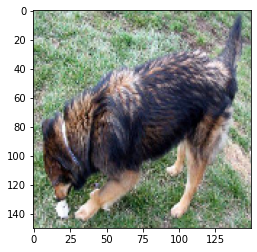

1/1 [==============================] - 0s 46ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 19


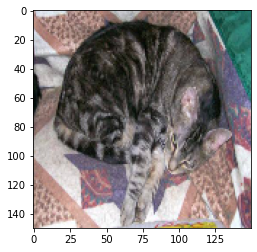

1/1 [==============================] - 0s 28ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 46


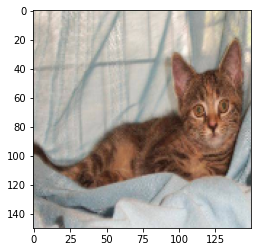

1/1 [==============================] - 0s 33ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 79


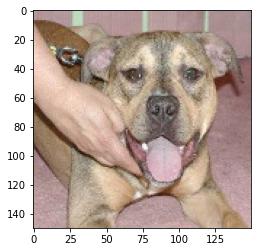

1/1 [==============================] - 0s 33ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 55


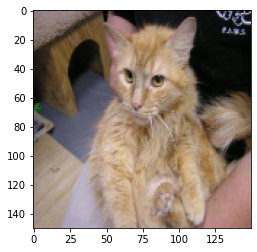

1/1 [==============================] - 0s 26ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 8


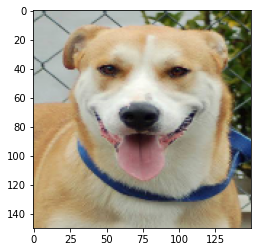

1/1 [==============================] - 0s 37ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 61


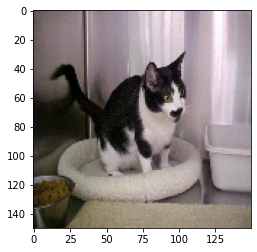

1/1 [==============================] - 0s 30ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 34


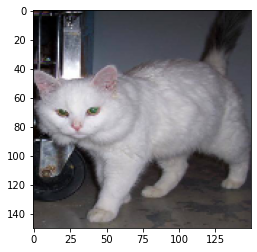

1/1 [==============================] - 0s 30ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 74


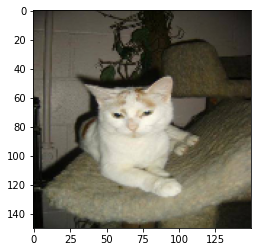

1/1 [==============================] - 0s 47ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 11


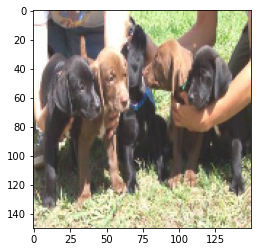

1/1 [==============================] - 0s 26ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 31


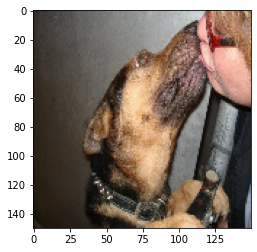

1/1 [==============================] - 0s 91ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 77


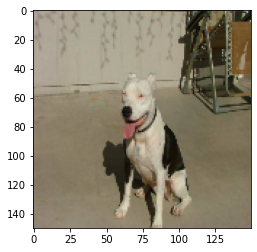

1/1 [==============================] - 0s 28ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 83


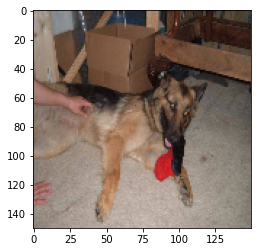

1/1 [==============================] - 0s 26ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 53


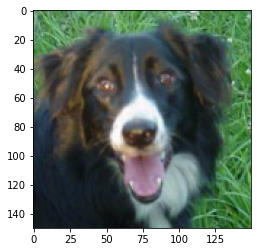

1/1 [==============================] - 0s 27ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 80


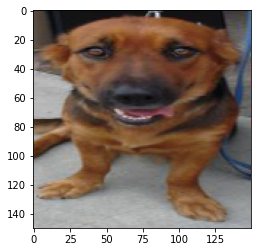

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 25


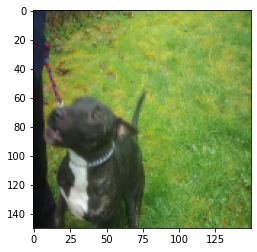

1/1 [==============================] - 0s 29ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 37


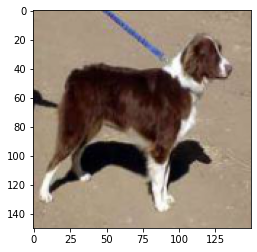

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 28


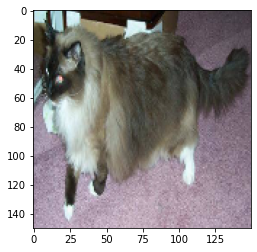

1/1 [==============================] - 0s 30ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 38


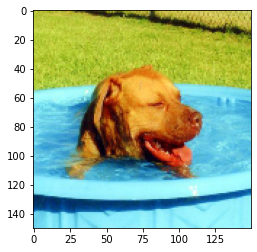

1/1 [==============================] - 0s 28ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 15


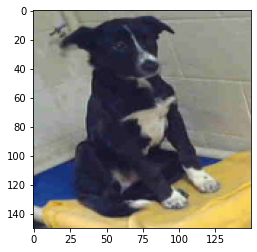

1/1 [==============================] - 0s 28ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 64


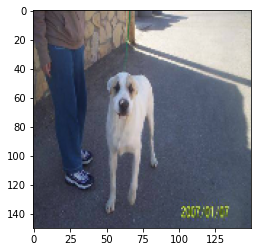

1/1 [==============================] - 0s 30ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 35


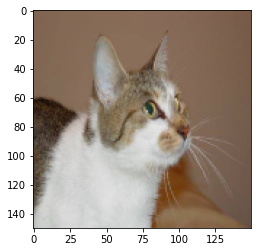

1/1 [==============================] - 0s 36ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 27


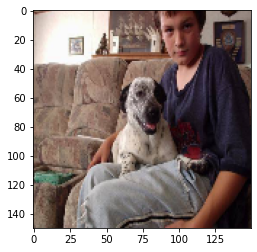

1/1 [==============================] - 0s 40ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 98


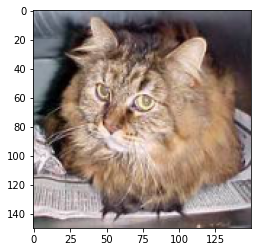

1/1 [==============================] - 0s 29ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 71


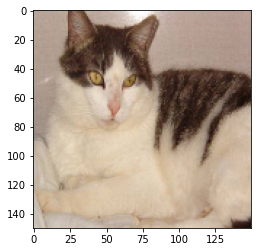

1/1 [==============================] - 0s 31ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 33


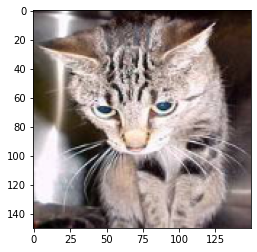

1/1 [==============================] - 0s 40ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 52


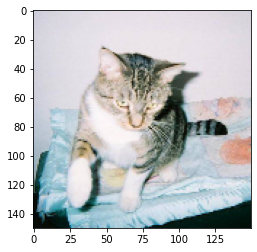

1/1 [==============================] - 0s 37ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 18


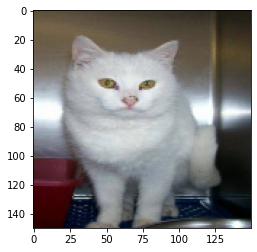

1/1 [==============================] - 0s 31ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 69


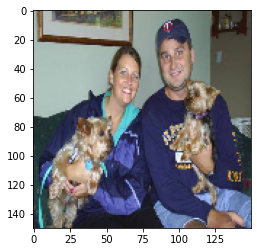

1/1 [==============================] - 0s 29ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 2


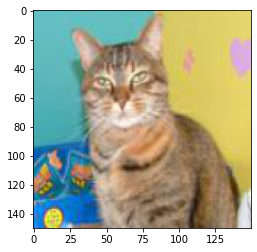

1/1 [==============================] - 0s 46ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 60


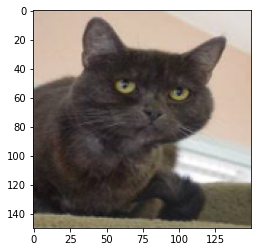

1/1 [==============================] - 0s 27ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 51


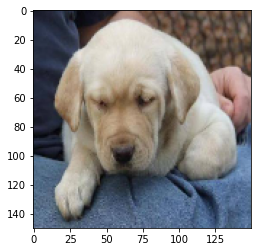

1/1 [==============================] - 0s 27ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 40


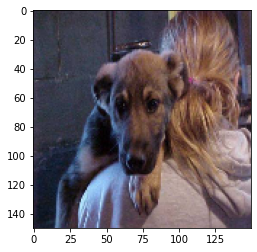

1/1 [==============================] - 0s 30ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 42


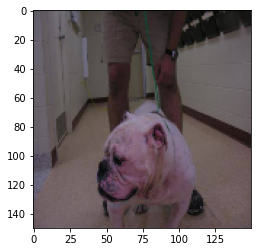

1/1 [==============================] - 0s 27ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 12


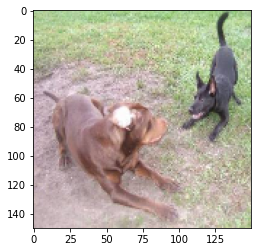

1/1 [==============================] - 0s 60ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 23


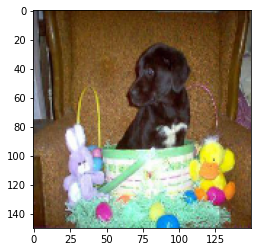

1/1 [==============================] - 0s 48ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 59


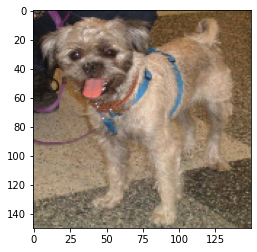

1/1 [==============================] - 0s 49ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 65


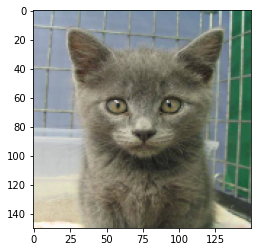

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 75


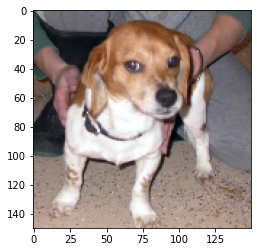

1/1 [==============================] - 0s 47ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 5


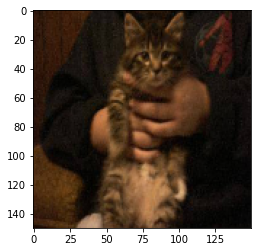

1/1 [==============================] - 0s 27ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 41


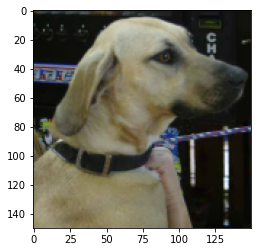

1/1 [==============================] - 0s 35ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 32


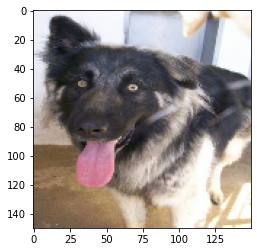

1/1 [==============================] - 0s 27ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 29


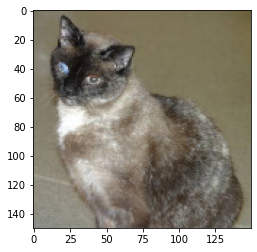

1/1 [==============================] - 0s 28ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 91


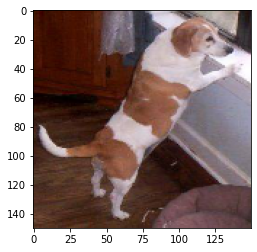

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 4


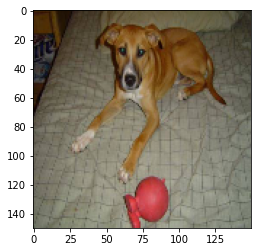

1/1 [==============================] - 0s 27ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 56


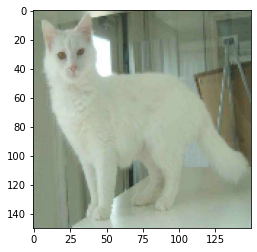

1/1 [==============================] - 0s 28ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 45


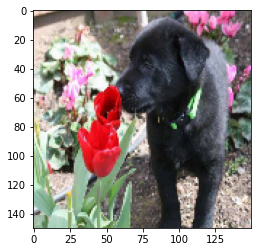

1/1 [==============================] - 0s 27ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 66


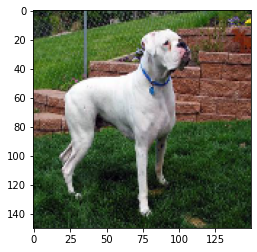

1/1 [==============================] - 0s 27ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 63


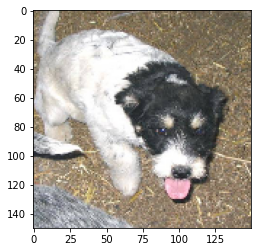

1/1 [==============================] - 0s 29ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 20


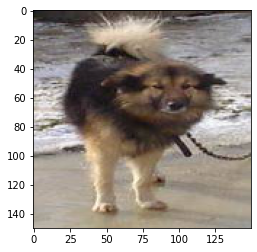

1/1 [==============================] - 0s 32ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 50


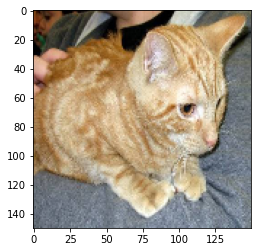

1/1 [==============================] - 0s 34ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 57


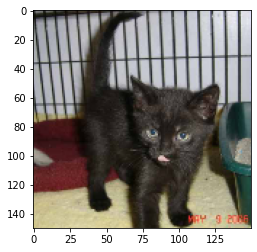

1/1 [==============================] - 0s 28ms/step
예측값 : ['강아지']  실제값 : 고양이  결과 : 틀림  인덱스 : 94


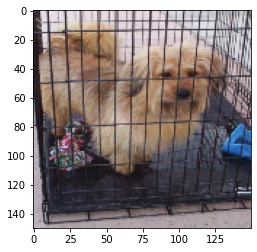

1/1 [==============================] - 0s 24ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 58


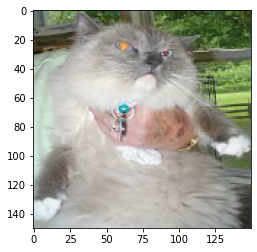

1/1 [==============================] - 0s 31ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 0


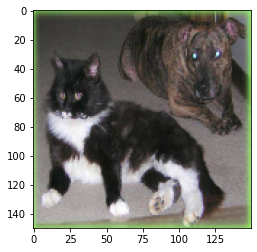

1/1 [==============================] - 0s 37ms/step
예측값 : ['고양이']  실제값 : 고양이  결과 : 맞음  인덱스 : 22


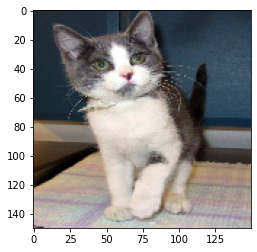

In [30]:
for ind in inds:
    plt.imshow(X_train[ind].astype(np.int))
    pred = model.predict(X_train[[ind]])
    pred = np.where(pred>0.5,'강아지','고양이')[0]
    real = np.where(y_train >0.5,'강아지','고양이')[0]
    if pred == real:
        result = '맞음'
    else:
        result = '틀림'
    print("예측값 :",pred, " 실제값 :", real, " 결과 :",result, " 인덱스 :", ind )
    plt.show()